<h1>Demand prediction (area 8)<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Preprocessing" data-toc-modified-id="Preprocessing-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Preprocessing</a></span></li><li><span><a href="#Outliers" data-toc-modified-id="Outliers-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Outliers</a></span><ul class="toc-item"><li><span><a href="#Outlier-detection" data-toc-modified-id="Outlier-detection-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Outlier detection</a></span><ul class="toc-item"><li><span><a href="#IQR-method" data-toc-modified-id="IQR-method-2.1.1"><span class="toc-item-num">2.1.1&nbsp;&nbsp;</span>IQR method</a></span></li><li><span><a href="#Z-score-method" data-toc-modified-id="Z-score-method-2.1.2"><span class="toc-item-num">2.1.2&nbsp;&nbsp;</span>Z-score method</a></span></li><li><span><a href="#Seasonal-decomposition" data-toc-modified-id="Seasonal-decomposition-2.1.3"><span class="toc-item-num">2.1.3&nbsp;&nbsp;</span>Seasonal decomposition</a></span><ul class="toc-item"><li><span><a href="#Stationarity" data-toc-modified-id="Stationarity-2.1.3.1"><span class="toc-item-num">2.1.3.1&nbsp;&nbsp;</span>Stationarity</a></span></li><li><span><a href="#Analysis-of-residuals" data-toc-modified-id="Analysis-of-residuals-2.1.3.2"><span class="toc-item-num">2.1.3.2&nbsp;&nbsp;</span>Analysis of residuals</a></span></li></ul></li><li><span><a href="#Isolation-forest" data-toc-modified-id="Isolation-forest-2.1.4"><span class="toc-item-num">2.1.4&nbsp;&nbsp;</span>Isolation forest</a></span></li></ul></li><li><span><a href="#Explanation-of-anomalies" data-toc-modified-id="Explanation-of-anomalies-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Explanation of anomalies</a></span><ul class="toc-item"><li><span><a href="#Holidays" data-toc-modified-id="Holidays-2.2.1"><span class="toc-item-num">2.2.1&nbsp;&nbsp;</span>Holidays</a></span></li><li><span><a href="#Weather" data-toc-modified-id="Weather-2.2.2"><span class="toc-item-num">2.2.2&nbsp;&nbsp;</span>Weather</a></span><ul class="toc-item"><li><span><a href="#Web-scaping" data-toc-modified-id="Web-scaping-2.2.2.1"><span class="toc-item-num">2.2.2.1&nbsp;&nbsp;</span>Web scaping</a></span></li><li><span><a href="#Analysis-of-weather" data-toc-modified-id="Analysis-of-weather-2.2.2.2"><span class="toc-item-num">2.2.2.2&nbsp;&nbsp;</span>Analysis of weather</a></span></li></ul></li><li><span><a href="#Public-events" data-toc-modified-id="Public-events-2.2.3"><span class="toc-item-num">2.2.3&nbsp;&nbsp;</span>Public events</a></span></li></ul></li></ul></li><li><span><a href="#Model-training" data-toc-modified-id="Model-training-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Model training</a></span><ul class="toc-item"><li><span><a href="#LGBM" data-toc-modified-id="LGBM-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>LGBM</a></span><ul class="toc-item"><li><span><a href="#Feature-engineering" data-toc-modified-id="Feature-engineering-3.1.1"><span class="toc-item-num">3.1.1&nbsp;&nbsp;</span>Feature engineering</a></span></li><li><span><a href="#Training" data-toc-modified-id="Training-3.1.2"><span class="toc-item-num">3.1.2&nbsp;&nbsp;</span>Training</a></span></li></ul></li><li><span><a href="#LSTM" data-toc-modified-id="LSTM-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>LSTM</a></span></li></ul></li><li><span><a href="#Testing" data-toc-modified-id="Testing-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Testing</a></span></li><li><span><a href="#Conclusion" data-toc-modified-id="Conclusion-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Conclusion</a></span></li></ul></div>

In this notebook I analyse Chicago taxi demand in 2022 for community area 8, which is the busiest. We will also build prediction models using LightGBM and LSTM network

# Preprocessing

The dataset is already preprocessed in the previous notebook. It was made from the dataset with Chicago taxi trips for 2022 [data.cityofchicago.org](https://data.cityofchicago.org/Transportation/Taxi-Trips-2022/npd7-ywjz). Here we analyze only the busiest area 8 that did poorly on pyspark.ml.GBTRegressor. It will now be used to train more sofisticated models than we tried earlier

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import re
import sys

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

import holidays

from sklearn.preprocessing import MinMaxScaler, OrdinalEncoder
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV

import lightgbm as lgb

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
import scipy.stats as st
from phik import phik_matrix, significance_matrix, outlier_significance_matrix
from phik.report import plot_correlation_matrix

from selenium import webdriver
from selenium.webdriver.common.by import By
from webdriver_manager.chrome import ChromeDriverManager
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC

import tensorflow as tf
from keras.optimizers import Adam
from keras.layers import Dense, Dropout, LSTM, Bidirectional
from keras.layers import BatchNormalization, Activation
from keras.models import Sequential
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [2]:
data = pd.read_csv('area8_trips_2022.csv',
                   index_col='ds',
                   parse_dates=['ds'])
data['hour'] = data.index.hour
data['weekday'] = data.index.weekday

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 2022-01-01 00:00:00 to 2022-12-31 23:00:00
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   y        8760 non-null   int64
 1   hour     8760 non-null   int64
 2   weekday  8760 non-null   int64
dtypes: int64(3)
memory usage: 273.8 KB


In [4]:
data.head()

,y,hour,weekday
ds,,,
2022-01-01 00:00:00,190,0,5
2022-01-01 01:00:00,187,1,5
2022-01-01 02:00:00,185,2,5
2022-01-01 03:00:00,175,3,5
2022-01-01 04:00:00,93,4,5


# Outliers

One of the reasons the previous model did poorly is outliers. We will try to understand what causes anomalies in taxi demand

## Outlier detection

There are clear spikes in the data that can be seen in the following plot

In [5]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data.resample('1D').sum().index, 
                         y=data.resample('1D').sum()['y']))

fig.update_layout(title='Daily demand on taxi',
                  xaxis=dict(
                      rangeslider=dict(
                          visible=True,
                          bgcolor="#636EFA",
                          thickness=0.05)),
                  autosize=False,
                  width=950,
                  height=600)

### IQR method

Seems like hourly demand is within normal range and there are very few evident outliers if checked by the iqr method

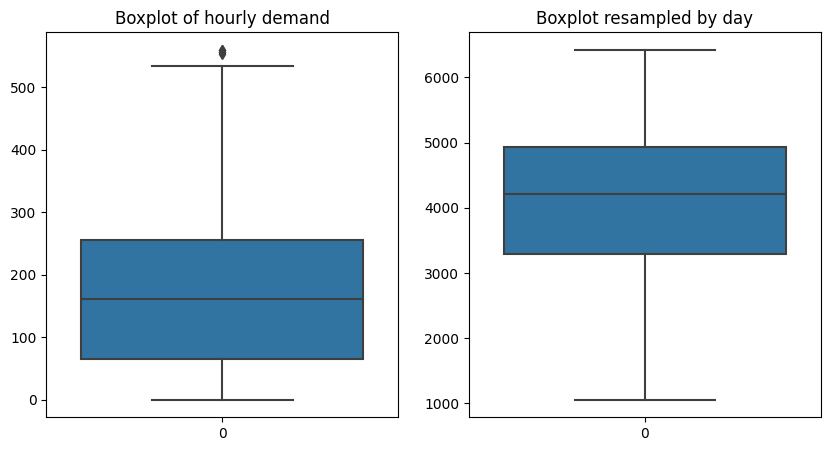

In [6]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

sns.boxplot(data['y'], ax=ax[0]) 
sns.boxplot(data.resample('1D').sum()['y'], ax=ax[1])

ax[0].set(title='Boxplot of hourly demand')
ax[1].set(title='Boxplot resampled by day');

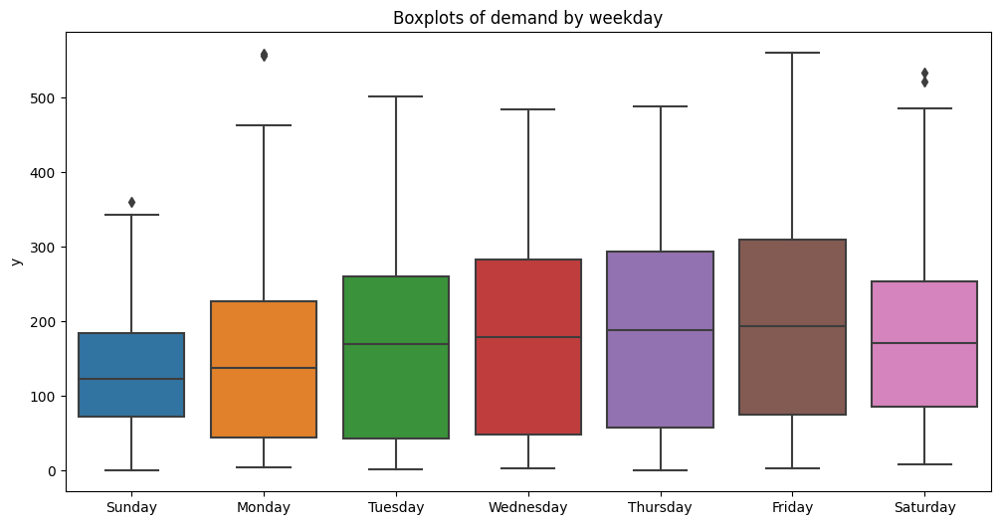

In [7]:
weekday_dict = {6: 'Sunday',
                0: 'Monday',
                1: 'Tuesday',
                2: 'Wednesday',
                3: 'Thursday',
                4: 'Friday',
                5: 'Saturday'}

data['weekday_names'] = data['weekday'].replace(weekday_dict)

plt.figure(figsize=(12, 6))
plt.title('Boxplots of demand by weekday')
sns.boxplot(data=data, x='weekday_names', y='y', order=weekday_dict.values()) \
   .set(xlabel=None);

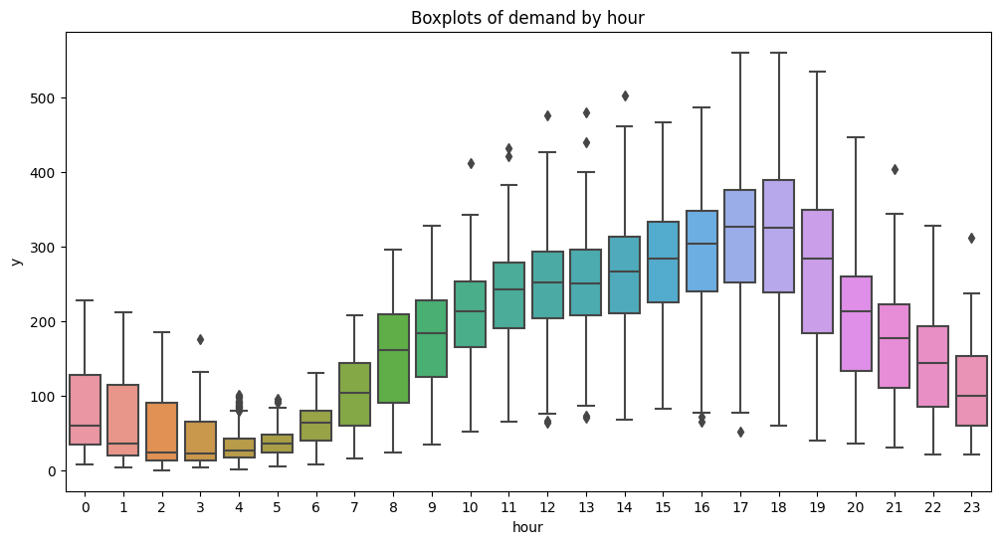

In [8]:
plt.figure(figsize=(12, 6))
plt.title('Boxplots of demand by hour')
sns.boxplot(data=data, x='hour', y='y');

### Z-score method

Hourly demand does not appear to be normally distributed, hence z-score method is not applicable

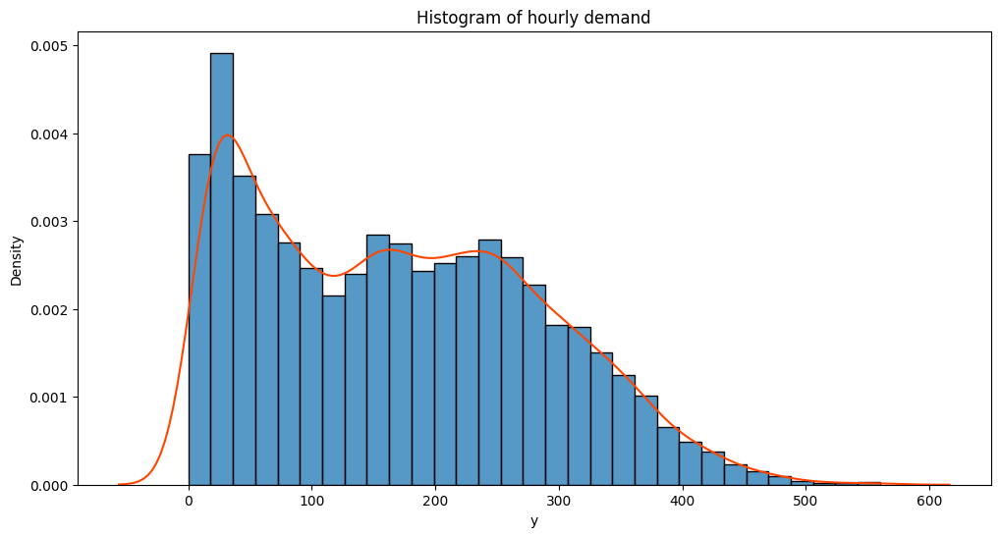

In [9]:
plt.figure(figsize=(12, 6))
plt.title('Histogram of hourly demand')
sns.histplot(data['y'], stat='density')
sns.kdeplot(data['y'], color='orangered');

### Seasonal decomposition

In this sectoin we will try to determine outliers using time series decomposition

#### Stationarity

In this section we will explore whether the time series is stationary or non-stationary using plots of moving averages and statistical tests

The plots below suggest that the series might be non-stationary, since trend and standard deviation are not perfectly constant

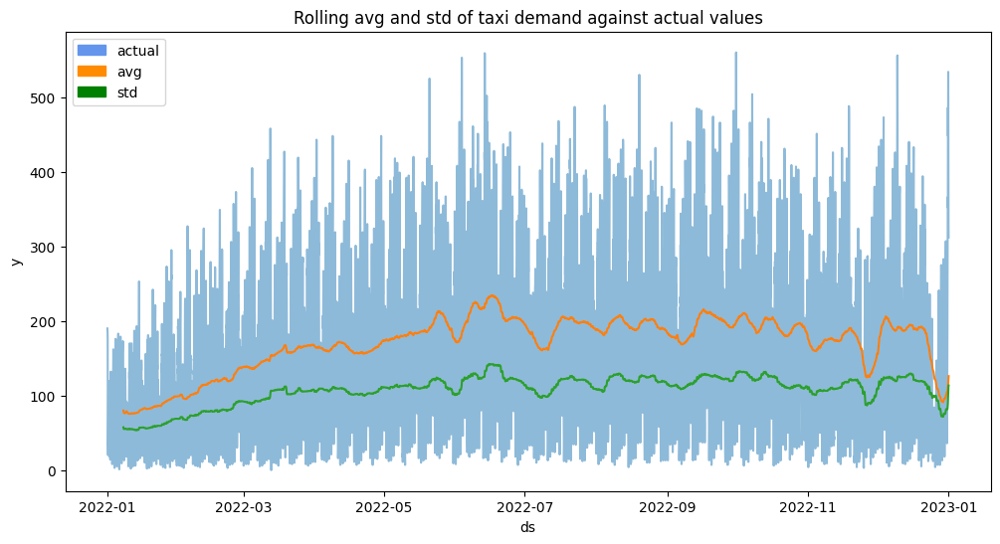

In [10]:
plt.figure(figsize=(12, 6))
plt.title('Rolling avg and std of taxi demand against actual values')
sns.lineplot(data['y'], alpha=0.5)
sns.lineplot(data['y'].rolling(168).mean())
sns.lineplot(data['y'].rolling(168).std())

blue_patch = mpatches.Patch(color='cornflowerblue', label='actual')
orange_patch = mpatches.Patch(color='darkorange', label='avg')
green_patch = mpatches.Patch(color='green', label='std')

plt.legend(handles=[blue_patch, orange_patch, green_patch])

plt.show();

Augmented Dickey–Fuller test suggests that the series is stationary

In [11]:
result = adfuller(data['y'])
print(f'ADF Statistic: {result[0]:.2g}')
print(f'p-value: {result[1]:.5f}')
print('Critical Values:')
for key, value in result[4].items():
    print('\t{}: {}'.format(key, value))

ADF Statistic: -5.8
p-value: 0.00000
Critical Values:
	1%: -3.431099882538333
	5%: -2.8618713981324873
	10%: -2.56694639826003


#### Analysis of residuals

You can see extreme values of residuals in February, March, September, November, December

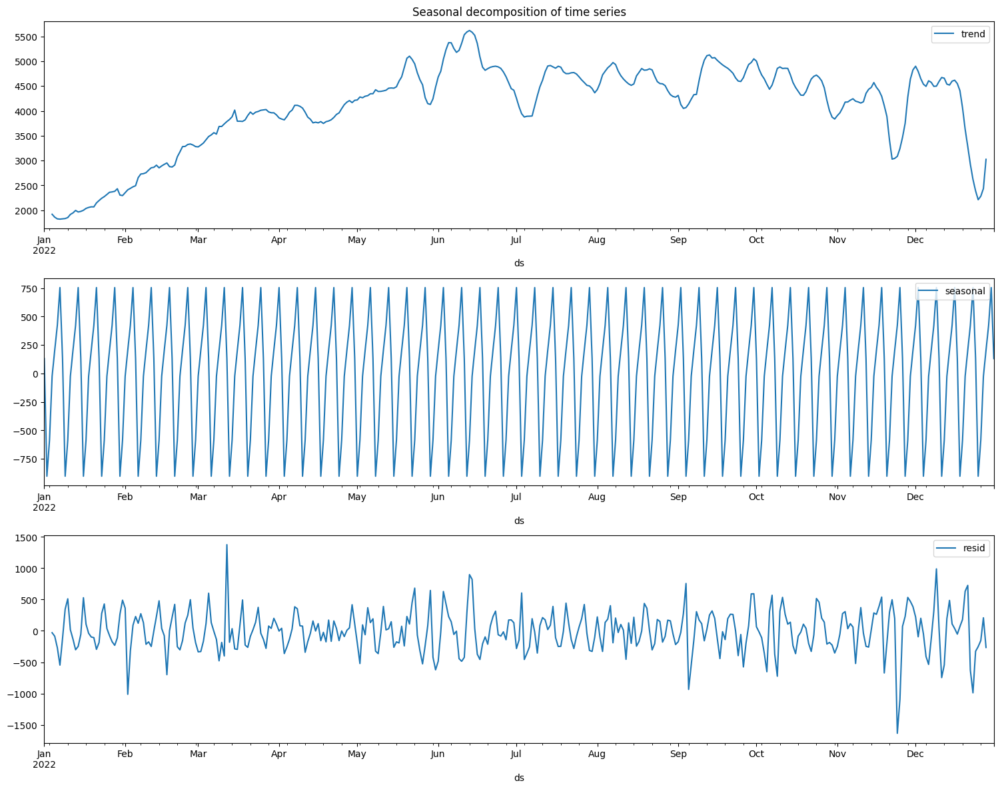

In [12]:
decomposed = seasonal_decompose(data['y'].resample('1D').sum())

plt.figure(figsize=(15, 15))

plt.subplot(411)
decomposed.trend.plot()
plt.legend()
plt.tight_layout()
plt.title('Seasonal decomposition of time series')

plt.subplot(412)
decomposed.seasonal.plot()
plt.legend()

plt.subplot(413)
decomposed.resid.plot()
plt.legend()

plt.show()

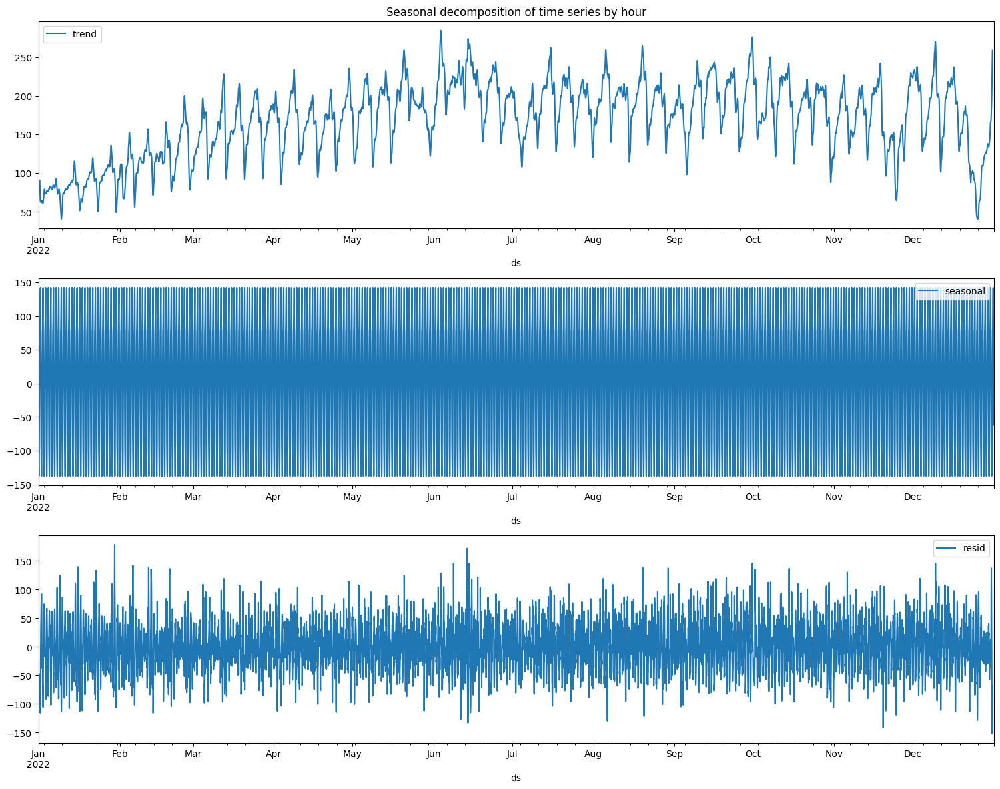

In [13]:
decomposed = seasonal_decompose(data['y'])

plt.figure(figsize=(15, 15))

plt.subplot(411)
decomposed.trend.plot()
plt.legend()
plt.tight_layout()
plt.title('Seasonal decomposition of time series by hour')

plt.subplot(412)
decomposed.seasonal.plot()
plt.legend()

plt.subplot(413)
decomposed.resid.plot()
plt.legend()

plt.show()

In [14]:
residuals = decomposed.resid
residuals.describe()

count    8736.000000
mean       -0.079143
std        41.863549
min      -151.013839
25%       -28.872956
50%        -0.267445
75%        27.765980
max       178.409810
Name: resid, dtype: float64

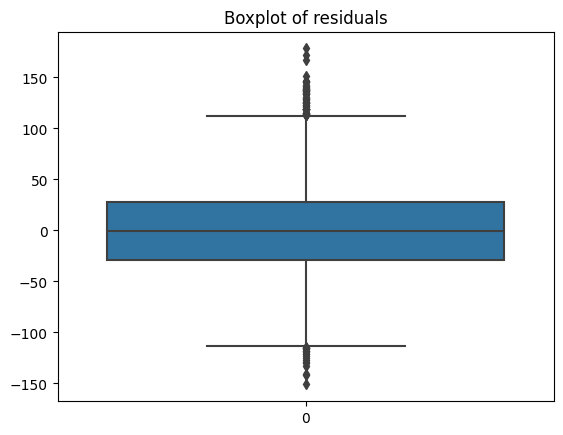

In [15]:
sns.boxplot(residuals)
plt.title('Boxplot of residuals');

In [16]:
q1 = residuals.quantile(0.25)
q3 = residuals.quantile(0.75)
iqr = q3 - q1

out1 = q1 - 1.5*iqr
out2 = q3 + 1.5*iqr

In [17]:
outliers = residuals[(residuals<=out1) | (residuals>=out2)]
outlier_dates = set(outliers.index)

In [18]:
residuals = pd.DataFrame(residuals)

In [19]:
residuals['weekday'] = residuals.index.weekday
residuals['weekday'].replace(weekday_dict, inplace=True)
residuals['hour'] = residuals.index.hour

Most outliers fall on Friday, Saturday, Sunday; at 18:00, 19:00, and 01:00

In [20]:
marker_colors = ['red' if i in outlier_dates else 'black' for i in residuals.index]
marker_symbols = ['circle' if i in outlier_dates else 'line-ns' for i in residuals.index]
hover_texts = [f"{i} at {j}:00" for i, j in zip(residuals['weekday'], residuals['hour'])]

fig = go.Figure()
fig.add_trace(go.Scatter(x=residuals.index, 
                         y=residuals['resid'],
                         mode='lines+markers',
                         marker=dict(color=marker_colors,
                                     symbol=marker_symbols),
                         text=hover_texts,
                        ))
fig.update_layout(title='Seasonal decomposition residuals of hourly demand with outliers',
                  xaxis=dict(
                      rangeslider=dict(
                          visible=True,
                          bgcolor="#636EFA",
                          thickness=0.05
                      )),
                  autosize=False,
                  width=950,
                  height=600)

In [21]:
residuals[residuals.index.isin(outlier_dates)] \
    .pivot_table(index='weekday', columns='hour', 
                 aggfunc='count', fill_value='', margins=True)

resid                                                              \
hour          0    1    2    3    4    7    8    9   12   13   14   17   18   
weekday                                                                       
Friday                                                             1.0  5.0   
Monday                                                   1.0       1.0  1.0   
Saturday         2.0  1.0            1.0  4.0  1.0                 2.0  2.0   
Sunday      3.0  9.0  7.0  2.0                                     1.0  2.0   
Thursday                                                                2.0   
Tuesday          1.0  1.0  1.0  1.0                 1.0  1.0  1.0       2.0   
Wednesday        1.0                                     1.0  1.0             
All           3   13    9    3    1    1    4    1    1    3    2    5   14   

                         
hour        19   20 All  
weekday                  
Friday     7.0  2.0  15  
Monday     1.0        4  
Saturday   1.0  2.0  16  
Sunday     1.0       25  
Thursday   1.0        3  
Tuesday               9  
Wednesday             3  
All         11    4  75

### Isolation forest

In the previous notebook we found out that hour and weekday are one of the most important time-series features for our task. Since the results of the isolation forest will be drastically different if we also add month or day, we will stick to only 3 features. This will also help avoid the curse of dimentionality

In [22]:
model = IsolationForest(contamination=0.01, random_state=12345)

cols = ['y', 'hour', 'weekday']

data['outlier'] = model.fit_predict(data[cols].to_numpy())
data['outlier'] = data['outlier'].apply(lambda x: 1 if x==-1 else 0)

In [23]:
forest_outliers = data[data['outlier']==1].index

In [24]:
scores = model.decision_function(data.loc[data['outlier']==1, cols].to_numpy())

In [25]:
# choosing 50 most abnormal values
forest_outliers = pd.DataFrame(scores, index=forest_outliers)[0].sort_values().head(50).index

In [26]:
marker_colors = ['orange' if i in forest_outliers else 'black' for i in data.index]
marker_symbols = ['circle' if i in forest_outliers else 'line-ns' for i in data.index]
hover_texts = [f"{i} at {j}:00" for i, j in zip(data['weekday'].replace(weekday_dict), data['hour'])]

fig = go.Figure()
fig.add_trace(go.Scatter(x=data.index, 
                         y=data['y'],
                         mode='lines+markers',
                         marker=dict(color=marker_colors,
                                     symbol=marker_symbols),
                         text=hover_texts,
                        ))
fig.update_layout(title='Hourly demand with outliers',
                  xaxis=dict(
                      rangeslider=dict(
                          visible=True,
                          bgcolor="#636EFA",
                          thickness=0.05
                      )),
                  autosize=False,
                  width=950,
                  height=600)

Seasonal decomposition shows that most anomalies are on Sunday at 01:00. Isolation forest points at Sunday 00:00 and 23:00. Out of 117 potential outliers these methods found in total, they agree only on 8 of them. Isolation forest did not find any outliers on Friday

In [27]:
data[data.index.isin(forest_outliers)] \
    .pivot_table(index='weekday_names', columns='hour', values='y', 
                 aggfunc='count', fill_value='', margins=True)

hour,0,1,2,12,13,14,15,16,17,18,19,22,23,All
weekday_names,,,,,,,,,,,,,,
Monday,,,,,,1.0,1.0,1.0,1.0,1.0,1.0,1.0,8.0,15
Saturday,,,,,,,,1.0,,1.0,1.0,,,3
Sunday,10.0,1.0,1.0,,,,,,,,,,17.0,29
Tuesday,,,,1.0,1.0,1.0,,,,,,,,3
All,10,1,1,1,1,2,1,2,1,2,2,1,25,50


In [28]:
len(set(forest_outliers) | outlier_dates)

117

In [29]:
len(set(forest_outliers) & outlier_dates)

8

## Explanation of anomalies

Here we will try to understand if these anomalies can be explained by holidays or the weather

### Holidays

Few outliers can be explained by holidays like New Year, Lincoln's Birthday, Thanksgiving or Christmas and some days before or after holidays

In [30]:
us_holidays = holidays.US(subdiv='IL', years=2022)

for date, name in sorted(us_holidays.items()):
    print(date, name)

2022-01-01 New Year's Day
2022-01-17 Martin Luther King Jr. Day
2022-02-11 Lincoln's Birthday (Observed)
2022-02-12 Lincoln's Birthday
2022-02-21 Washington's Birthday
2022-03-07 Casimir Pulaski Day
2022-05-30 Memorial Day
2022-06-19 Juneteenth National Independence Day
2022-06-20 Juneteenth National Independence Day (Observed)
2022-07-04 Independence Day
2022-09-05 Labor Day
2022-10-10 Columbus Day
2022-11-08 Election Day
2022-11-11 Veterans Day
2022-11-24 Thanksgiving
2022-12-25 Christmas Day
2022-12-26 Christmas Day (Observed)


In [31]:
holiday_dates = set(us_holidays.keys())

New Year, Lincoln's Birthday, Thanksgiving, Christmas day face anomalies in demand

In [32]:
set(outliers.index.date) & holiday_dates

{datetime.date(2022, 1, 1),
 datetime.date(2022, 2, 12),
 datetime.date(2022, 11, 24),
 datetime.date(2022, 12, 25)}

This also concerns Martin Luther King Jr. Day and Washington's Birthday

In [33]:
set(forest_outliers.date) & holiday_dates

{datetime.date(2022, 1, 17),
 datetime.date(2022, 2, 21),
 datetime.date(2022, 12, 25)}

One day before Martin Luther King Jr. Day, Washington's Birthday, Christmas people use taxis differently

In [34]:
prev_dates = []

for date in us_holidays.copy():
    prev_dates.append(date - timedelta(days=1))

In [35]:
set(outliers.index.date) & set(prev_dates)

{datetime.date(2022, 1, 16),
 datetime.date(2022, 2, 20),
 datetime.date(2022, 12, 25)}

In [36]:
set(forest_outliers.date) & set(prev_dates)

{datetime.date(2022, 1, 16),
 datetime.date(2022, 2, 20),
 datetime.date(2022, 12, 25)}

Demand is different day after Lincoln's Birthday and New Year

In [37]:
foll_dates = []

for date in us_holidays.copy():
    foll_dates.append(date + timedelta(days=1))

In [38]:
set(outliers.index.date) & set(foll_dates)

{datetime.date(2022, 2, 12), datetime.date(2022, 2, 13)}

In [39]:
set(forest_outliers.date) & set(foll_dates)

{datetime.date(2022, 1, 2)}

Since isolation forest mistakenly and repetitively identifies Sunday 00:00 as an outlier, I decided to only consider those anomalies found by seasonal decomposition

In [40]:
not_holidays = set(outliers.index.date) - \
                holiday_dates - \
                set(prev_dates) - \
                set(foll_dates)
# excluding Halloween and New Year's Eve
not_holidays = {date for date in not_holidays if date not in 
                [datetime.strptime('2022-12-31', '%Y-%m-%d').date(),
                 datetime.strptime('2022-10-31', '%Y-%m-%d').date()]}

In [41]:
print(f'There are {len(not_holidays)} days with anomalous demand that cannot be explained by holidays')

There are 34 days with anomalous demand that cannot be explained by holidays


In [42]:
not_holidays = {i for i in outlier_dates if i.date() in not_holidays}

### Weather

Much of the following section deals with web scraping with Selenium and compiles a dataframe with Chicago weather for 2022, since ready dataframes were not available

#### Web scaping

Loading weather dataframes from [wunderground.com](https://www.wunderground.com/history/daily/us/il/chicago/KMDW)

The following code has been commented out because it took several minutes to process and we might need to restart the kernel and run all cells in the future. The resulting dataframe has been saved as a csv file

In [43]:
'''
options = webdriver.ChromeOptions() 
options.add_argument('--headless')
options.add_argument('--blink-settings=imagesEnabled=false')
options.add_argument('load-extension=C:/Users/albin/OneDrive/Документы/adblock')
options.add_argument("--disable-javascript")

driver = webdriver.Chrome(options=options)
'''

'\noptions = webdriver.ChromeOptions() \noptions.add_argument(\'--headless\')\noptions.add_argument(\'--blink-settings=imagesEnabled=false\')\noptions.add_argument(\'load-extension=C:/Users/albin/OneDrive/Документы/adblock\')\noptions.add_argument("--disable-javascript")\n\ndriver = webdriver.Chrome(options=options)\n'

In [44]:
'''
columns = ['Time', 'Temperature', 'Humidity', 
           'Wind Speed', 'Pressure', 'Precip.', 'Condition']

def extract_numbers(series):
    return series.str.extract('(\d+\.\d+|\d+)').astype(float)
'''

"\ncolumns = ['Time', 'Temperature', 'Humidity', \n           'Wind Speed', 'Pressure', 'Precip.', 'Condition']\n\ndef extract_numbers(series):\n    return series.str.extract('(\\d+\\.\\d+|\\d+)').astype(float)\n"

In [45]:
'''
def get_table(date):
    url = f'https://www.wunderground.com/history/daily/us/il/chicago/KMDW/date/{date}'
    driver.get(url)

    wait = WebDriverWait(driver, 10)
    wait.until(EC.presence_of_element_located((By.TAG_NAME, "table")))

    weather = pd.read_html(driver.page_source)[-1][columns].dropna()
    
    # Temperature is given in °F, Humidity - in °%, Wind Speed - in °mph,
    # Pressure and Precipitation - in °in
    for col in ['Temperature', 'Humidity', 'Wind Speed', 'Pressure', 'Precip.']:
        weather[col] = extract_numbers(weather[col])
    
    weather['Time'] = date + ' ' + weather['Time']
    weather['Time'] = pd.to_datetime(weather['Time'], format='%Y-%m-%d %I:%M %p')
    weather['Time'] = weather['Time'].dt.floor('H')
    weather = weather[weather['Time'] != f'{date} 00:00:00']
    weather = weather.groupby('Time').agg('last')
    
    return weather
'''

'\ndef get_table(date):\n    url = f\'https://www.wunderground.com/history/daily/us/il/chicago/KMDW/date/{date}\'\n    driver.get(url)\n\n    wait = WebDriverWait(driver, 10)\n    wait.until(EC.presence_of_element_located((By.TAG_NAME, "table")))\n\n    weather = pd.read_html(driver.page_source)[-1][columns].dropna()\n    \n    # Temperature is given in °F, Humidity - in °%, Wind Speed - in °mph,\n    # Pressure and Precipitation - in °in\n    for col in [\'Temperature\', \'Humidity\', \'Wind Speed\', \'Pressure\', \'Precip.\']:\n        weather[col] = extract_numbers(weather[col])\n    \n    weather[\'Time\'] = date + \' \' + weather[\'Time\']\n    weather[\'Time\'] = pd.to_datetime(weather[\'Time\'], format=\'%Y-%m-%d %I:%M %p\')\n    weather[\'Time\'] = weather[\'Time\'].dt.floor(\'H\')\n    weather = weather[weather[\'Time\'] != f\'{date} 00:00:00\']\n    weather = weather.groupby(\'Time\').agg(\'last\')\n    \n    return weather\n'

In [46]:
'''
data1 = get_table('2022-1-1')
interval = pd.date_range(start='2022-1-2', end='2022-12-31')
interval = [dt.strftime('%Y-%m-%d').replace('-0', '-') for dt in interval]
'''

"\ndata1 = get_table('2022-1-1')\ninterval = pd.date_range(start='2022-1-2', end='2022-12-31')\ninterval = [dt.strftime('%Y-%m-%d').replace('-0', '-') for dt in interval]\n"

In [47]:
'''
for date in interval:
    data2 = get_table(date)
    data1 = pd.concat([data1, data2])
    print(date)
'''

'\nfor date in interval:\n    data2 = get_table(date)\n    data1 = pd.concat([data1, data2])\n    print(date)\n'

In [48]:
weather = pd.read_csv('weather_chicago_2022.csv', sep='\t', index_col='Time')

In [49]:
weather.describe()

,Temperature,Humidity,Wind Speed,Pressure,Precip.
count,8347.000000,8347.000000,8347.000000,8347.000000,8347.000000
mean,53.699772,60.747215,10.468552,29.352468,0.002863
std,21.925750,15.601736,5.233403,0.211058,0.029740
min,0.000000,17.000000,0.000000,28.460000,0.000000
25%,37.000000,49.000000,7.000000,29.220000,0.000000
50%,55.000000,62.000000,10.000000,29.340000,0.000000
75%,73.000000,73.000000,14.000000,29.490000,0.000000
max,101.000000,100.000000,37.000000,29.970000,1.300000


In [50]:
weather['Condition'].value_counts()

Fair                       2278
Mostly Cloudy              2164
Cloudy                     1789
Partly Cloudy               816
Light Snow                  413
Light Rain                  354
Mostly Cloudy / Windy        95
Cloudy / Windy               77
Light Drizzle                77
Fair / Windy                 39
Light Snow / Windy           38
Rain                         25
Partly Cloudy / Windy        24
Fog                          22
Wintry Mix                   20
Light Rain / Windy           18
Blowing Snow / Windy         17
Light Rain with Thunder      14
Snow                         12
Thunder                      11
Haze                          7
T-Storm                       7
Blowing Snow                  6
Heavy Rain                    6
Light Drizzle / Windy         5
Heavy T-Storm / Windy         3
Heavy T-Storm                 2
Light Freezing Drizzle        2
Thunder / Windy               1
Heavy Rain / Windy            1
Thunder in the Vicinity       1
Drizzle 

#### Analysis of weather

Apparently, temperature and humidity can be useful for prediction, since they show significant correlation with the target; wind, pressure, rain and weather do not correlate with the target significantly

In [51]:
df = data[['y', 'hour', 'weekday']]

In [52]:
weather.index = pd.to_datetime(weather.index)

merged = df.merge(weather, left_on='ds', right_on='Time', how='left')
merged.index = df.index
merged = merged.fillna(method='bfill')
merged.columns = ['y', 'hour', 'weekday', 'temp', 'hum', 'wind', 'pres', 'rain', 'weather']

In [53]:
interval_cols = ['y', 'temp', 'hum', 'wind', 'pres', 'rain']

corr = merged[interval_cols].corr()
fig = px.imshow(corr, text_auto='.1f', 
                color_continuous_scale='blues', 
                title='Correlation matrix for interval data')
fig.show()

In [54]:
corr_matrix = merged.phik_matrix(interval_cols=interval_cols)
fig = px.imshow(corr_matrix, text_auto='.1f', 
                color_continuous_scale='redor', 
                title='Phik correlation matrix for all data')
fig.show()

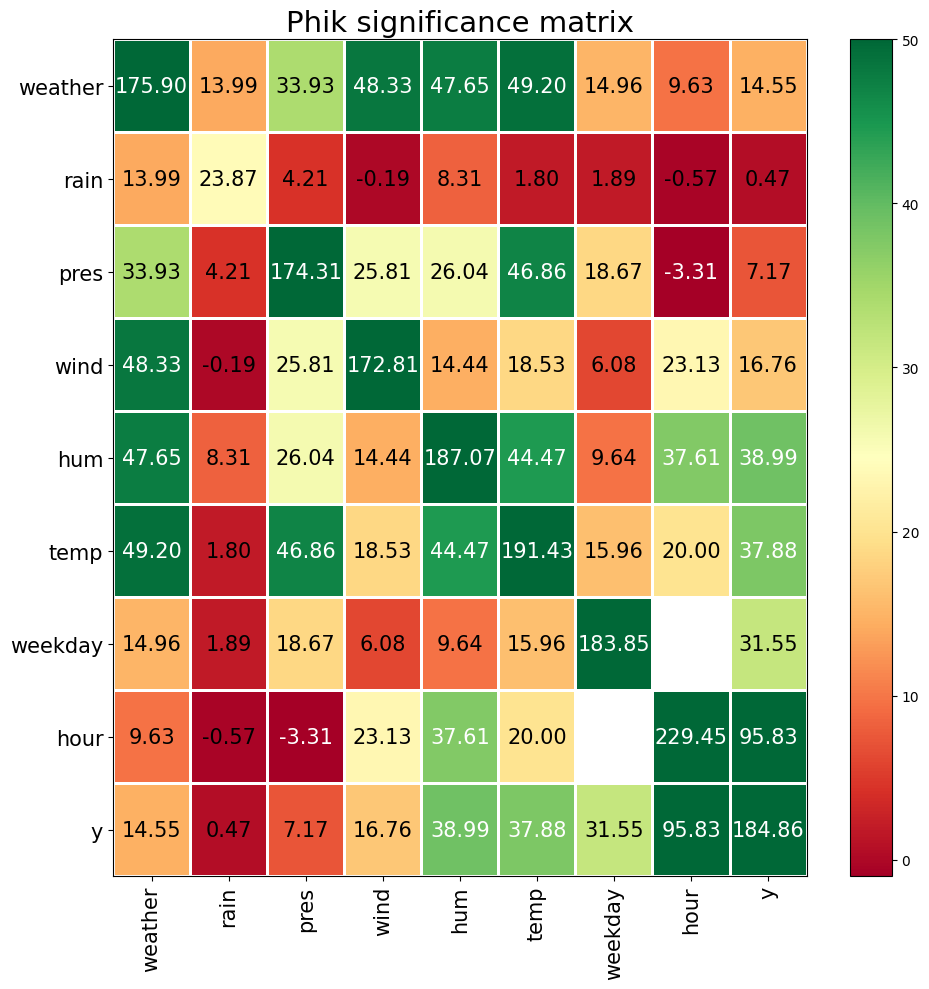

In [55]:
corr = merged.significance_matrix(interval_cols=interval_cols)

plot_correlation_matrix(corr.fillna(0).values, 
                        x_labels=corr.columns, 
                        y_labels=corr.index, 
                        vmin=-1, vmax=50, title="Phik significance matrix", 
                        usetex=False, fontsize_factor=1.5, figsize=(10, 10))

In [56]:
merged['not_holiday'] = merged.index.isin(not_holidays)

Few outliers can be explained by thunder or rain

In [57]:
merged.groupby('weather')['not_holiday'].sum().sort_values(ascending=False).head(11)

weather
Fair                       24
Mostly Cloudy              11
Cloudy                      7
Partly Cloudy               5
Light Rain                  4
Light Snow                  2
Thunder                     1
Light Rain with Thunder     1
Heavy T-Storm / Windy       1
Light Drizzle               1
T-Storm                     0
Name: not_holiday, dtype: int64

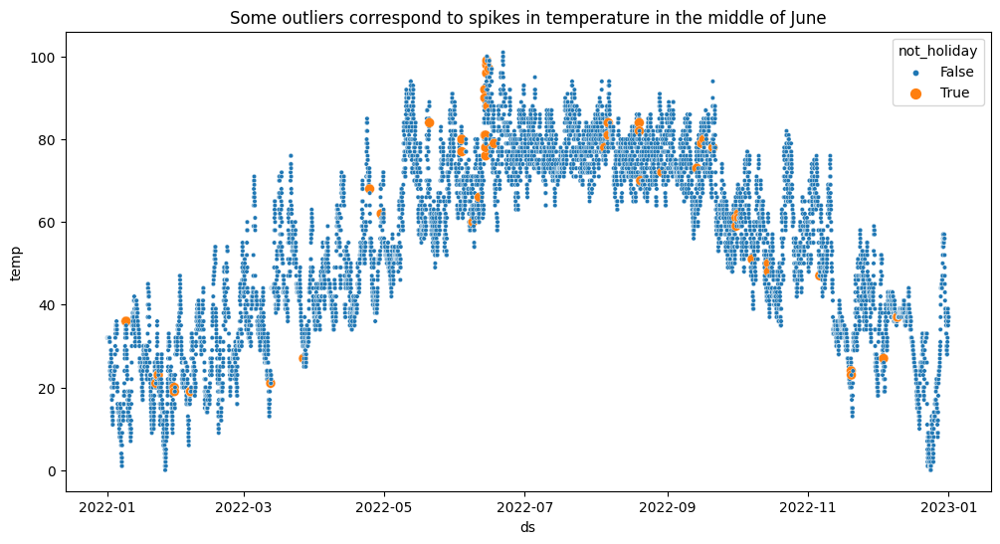

In [58]:
plt.figure(figsize=(12, 6))
plt.title('Some outliers correspond to spikes in temperature in the middle of June')
sns.scatterplot(merged, x='ds', y='temp', hue='not_holiday', size='not_holiday', sizes=(50, 10));

Indeed, "For the date of Jun 14, the highest temperature ever reached in Chicago history is 100 °F which happened in 2022." [extremeweatherwatch.com](https://www.extremeweatherwatch.com/cities/chicago/day/june-14)

In [59]:
rain = ['Rain', 'Thunder', 'Storm', 'Drizzle']

storms = merged[(merged['weather'].apply(lambda x: any(s in x for s in rain))) &
                (merged['not_holiday'])].index
storms = set(storms)

In [60]:
min_date = datetime.strptime('2022-06-13', '%Y-%m-%d').date()
max_date = datetime.strptime('2022-06-17', '%Y-%m-%d').date()

hot_weather = {i for i in not_holidays if i.date() >= min_date and i.date() <= max_date}

In [61]:
ambiguous = not_holidays - storms - hot_weather

In [62]:
merged.drop(columns=['wind', 'pres', 'rain', 'weather', 'not_holiday'], inplace=True)

### Public events

Some remaining outliers might be explained by public events listed on [do312.com](https://do312.com/events/2022/01/8):

|Date|Event|
|---|---|
|2022-01-09| Celebration of David Bowie's Birthday; Led Zeppelin concert|
|2022-03-12| St. Patrick's Day in Chicago|
|2022-08-19| Red Hot Chilli Pepper's World Tour|
|2022-09-30| Oktoberfest|
|2022-10-01| Oktoberfest|

In [63]:
print(f'There are {len({i.date() for i in ambiguous}) - 5} days in 2022 with unexplained ambiguous demand patterns')

There are 20 days in 2022 with unexplained ambiguous demand patterns


# Model training

In this section we will test different regressoin models and choose the best one. They are LGBM, LSTM NN

In [64]:
RANDOM_SEED = 12345

np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

## LGBM

This model will be our baseline

### Feature engineering

In [65]:
merged['day'] = merged.index.day
merged['month'] = merged.index.month

merged['lag_1'] = merged['y'].shift(1)
merged['lag_24'] = merged['y'].shift(24)
merged['lag_168'] = merged['y'].shift(168)

merged['rolling_mean'] = merged['y'].shift(1).rolling(6).mean()

In [66]:
merged['lag_1'].fillna(method='bfill', inplace=True)
merged['rolling_mean'].fillna(method='bfill', inplace=True)
merged['lag_24'].fillna(merged['lag_1'], inplace=True)
merged['lag_168'].fillna(merged['lag_1'], inplace=True)

In [67]:
events = ['2022-12-31', '2022-01-01', '2022-01-02',
          '2022-01-16', '2022-01-17', '2022-02-12',
          '2022-02-13', '2022-02-20', '2022-02-21',
          '2022-03-12', '2022-09-30', '2022-10-01',
          '2022-10-31', '2022-11-24', '2022-12-25']
events = [datetime.strptime(event, '%Y-%m-%d').date() for event in events]

merged['holiday'] = merged.index
merged['holiday'] = merged['holiday'] \
                    .apply(lambda x: 1 if x.date() in events else 0)

In [68]:
merged.head(10)

,y,hour,weekday,temp,hum,day,month,lag_1,lag_24,lag_168,rolling_mean,holiday
ds,,,,,,,,,,,,
2022-01-01 00:00:00,190,0,5,32.0,82.0,1,1,190.0,190.0,190.0,144.333333,1
2022-01-01 01:00:00,187,1,5,32.0,82.0,1,1,190.0,190.0,190.0,144.333333,1
2022-01-01 02:00:00,185,2,5,32.0,82.0,1,1,187.0,187.0,187.0,144.333333,1
2022-01-01 03:00:00,175,3,5,32.0,82.0,1,1,185.0,185.0,185.0,144.333333,1
2022-01-01 04:00:00,93,4,5,32.0,82.0,1,1,175.0,175.0,175.0,144.333333,1
2022-01-01 05:00:00,36,5,5,32.0,82.0,1,1,93.0,93.0,93.0,144.333333,1
2022-01-01 06:00:00,24,6,5,32.0,82.0,1,1,36.0,36.0,36.0,144.333333,1
2022-01-01 07:00:00,20,7,5,32.0,82.0,1,1,24.0,24.0,24.0,116.666667,1
2022-01-01 08:00:00,34,8,5,32.0,82.0,1,1,20.0,20.0,20.0,88.833333,1


### Training

In [68]:
X = merged.drop(columns='y')
y = merged['y']

In [69]:
model_gb = lgb.LGBMRegressor(random_state=RANDOM_SEED, 
                             n_jobs=-1)

param_grid_gb = {'boosting_type': ['gbdt', 'dart'],
                 'max_depth': [5, 8],
                 'num_leaves': [8, 16],
                 'learning_rate': [0.1, 0.15],
                 'n_estimators': [500, 600, 800]
                }

tscv = TimeSeriesSplit(n_splits=5)

gs_gb = GridSearchCV(
    estimator=model_gb, 
    param_grid=param_grid_gb,
    scoring='neg_mean_absolute_error',
    cv=tscv,
    n_jobs=-1)

gs_gb.fit(X, y)

gs_gb_best_score = gs_gb.best_score_
gs_gb_best_params = gs_gb.best_params_
print(f'best_score: {gs_gb_best_score}')
print(f'best_params: {gs_gb_best_params}')

best_score: -18.43892558410086
best_params: {'boosting_type': 'dart', 'learning_rate': 0.15, 'max_depth': 5, 'n_estimators': 600, 'num_leaves': 8}


## LSTM

LSTM neural networks were specifically designed to deal with sequential data and vanishing gradient. Here we will try to use its advantages

One drawback of bidirectional LSTMs is that they are not reproducible, since they are not deterministic

In [69]:
lstm = merged.copy()

In [70]:
scaler = MinMaxScaler()
lstm['temp'] = scaler.fit_transform(lstm['temp'].values.reshape(-1,1))
lstm['hum'] = scaler.fit_transform(lstm['hum'].values.reshape(-1,1))
lstm['lag_1'] = scaler.fit_transform(lstm['lag_1'].values.reshape(-1,1))
lstm['lag_24'] = scaler.fit_transform(lstm['lag_24'].values.reshape(-1,1))
lstm['lag_168'] = scaler.fit_transform(lstm['lag_168'].values.reshape(-1,1))
lstm['rolling_mean'] = scaler.fit_transform(lstm['rolling_mean'].values.reshape(-1,1))

lstm['y'] = scaler.fit_transform(lstm['y'].values.reshape(-1,1))

We will make the form of the data different so that it is digestible to the LSTM network

In [71]:
def data_prep(data, length):
    X = []
    y = []

    for i in range(length, len(data)):
        X.append(data.iloc[i - length: i])
        y.append(data.iloc[i])
        
    train_X = X[:7000]
    train_y = y[:7000]
    test_X = X[7000:]
    test_y = y[7000:]
    
    train_X = np.array(train_X)
    train_y = np.array(train_y)
    test_X = np.array(test_X)
    test_y = np.array(test_y)
    
    train_X = np.reshape(train_X, (7000, length, 1))
    test_X = np.reshape(test_X, (test_X.shape[0], length, 1))
    
    return [train_X, train_y, test_X, test_y]

I have run the code below several times with different network architectures and different features. With trial and error I arrived at the model below. For the activation function I used relu even though it is usually not recommended for LSTMs. I did it because the model has many layers and I wanted the gradients not to vanish too quickly. Relu performed better than tanh for this particular dataset and model. Since the activation function is different, I changed kernel regularizer to 'he_normal' which is recommended for relu. The model can also be improved by adding several dense layers on top of the recurrent layers. However, it only improved the metric marginally and significantly increased fitting time. I omitted dropout layers and recurrent dropouts because the model does not overfit greatly

In [72]:
lstm = lstm['y']

In [73]:
train_X, train_y, test_X, test_y = data_prep(lstm, 24)

print('train_X.shape = ',train_X.shape)
print('train_y.shape = ', train_y.shape)
print('test_X.shape = ', test_X.shape)
print('test_y.shape = ',test_y.shape)

train_X.shape =  (7000, 24, 1)
train_y.shape =  (7000,)
test_X.shape =  (1736, 24, 1)
test_y.shape =  (1736,)


In [77]:
act = 'relu'
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.2, 
                              patience=4, 
                              verbose=1, 
                              min_lr=0.00001)
   
model = Sequential()
model.add(LSTM(168, return_sequences=True, kernel_initializer='he_normal', activation=act,
               input_shape=(train_X.shape[1], train_X.shape[2])))

model.add(Bidirectional(LSTM(168, return_sequences=True, activation=act)))

model.add(Bidirectional(LSTM(168, return_sequences=True, activation=act)))

model.add(Bidirectional(LSTM(168, return_sequences=False, activation=act)))

model.add(Dense(1))

model.compile(optimizer='adam', loss="MAE")

model.fit(train_X, train_y, epochs=25, batch_size=128, 
          validation_split=0.1, 
          callbacks=[reduce_lr], verbose=1, shuffle=False)

Epoch 1/25
50/50 [==============================] - 108s 2s/step - loss: 0.0848 - val_loss: 0.0637 - lr: 0.0010
Epoch 2/25
50/50 [==============================] - 102s 2s/step - loss: 0.0529 - val_loss: 0.0517 - lr: 0.0010
Epoch 3/25
50/50 [==============================] - 103s 2s/step - loss: 0.0534 - val_loss: 0.0472 - lr: 0.0010
Epoch 4/25
50/50 [==============================] - 104s 2s/step - loss: 0.0428 - val_loss: 0.0405 - lr: 0.0010
Epoch 5/25
50/50 [==============================] - 103s 2s/step - loss: 0.0412 - val_loss: 0.0363 - lr: 0.0010
Epoch 6/25
50/50 [==============================] - 103s 2s/step - loss: 0.0366 - val_loss: 0.0342 - lr: 0.0010
Epoch 7/25
50/50 [==============================] - 104s 2s/step - loss: 0.0365 - val_loss: 0.0332 - lr: 0.0010
Epoch 8/25
50/50 [==============================] - 103s 2s/step - loss: 0.0342 - val_loss: 0.0325 - lr: 0.0010
Epoch 9/25
50/50 [==============================] - 104s 2s/step - loss: 0.0332 - val_loss: 0.0335 - lr:

In [78]:
predictions = model.predict(test_X)
score = mean_absolute_error(test_y, predictions)
print('MAE:', score)

55/55 [==============================] - 11s 187ms/step
MAE: 0.03154303316142498


In [79]:
test = scaler.inverse_transform(test_y.reshape(1, -1))
pred = scaler.inverse_transform(predictions.reshape(1, -1))

x = test - pred
mae = abs(x).mean()

mae

17.664098581410773

# Testing

The best model appears to be LSTM. Here we will plot its predictions against the actual data to better evaluate it

In [80]:
testing = pd.DataFrame({'actual': test.flatten(), 
                        'predictions': pred.flatten()}, 
                       index=lstm.index[-1736:])

In [81]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=testing.index, 
                         y=testing['actual'], 
                         name='actual'))
fig.add_trace(go.Scatter(x=testing.index, 
                         y=testing['predictions'],
                         name='predictions'))

fig.update_layout(title='LSTM predictions against actual data',
                  xaxis=dict(
                      rangeslider=dict(
                          visible=True,
                          bgcolor="#636EFA",
                          thickness=0.05)),
                  autosize=False,
                  width=950,
                  height=600)

Despite the fact that MAE is small enough, some of the errors the model produces are quite big. Some of those large errors have to do with the outliers we have described earlier

In [117]:
ae = pd.DataFrame({'errors': (test - pred).flatten(),
                   'percentage': ((test - pred)/test).flatten(),
                   'abs_errors': abs((test - pred)).flatten(),
                   'abs_percentage': abs(((test - pred)/test)).flatten()}, lstm.index[-1736:])
ae.head()

,errors,percentage,abs_errors,abs_percentage
ds,,,,
2022-10-20 16:00:00,-18.819305,-0.055844,18.819305,0.055844
2022-10-20 17:00:00,-7.572693,-0.020919,7.572693,0.020919
2022-10-20 18:00:00,-41.787384,-0.124367,41.787384,0.124367
2022-10-20 19:00:00,56.999023,0.161470,56.999023,0.161470
2022-10-20 20:00:00,-36.531403,-0.148502,36.531403,0.148502


In [118]:
ae.describe().T

,count,mean,std,min,25%,50%,75%,max
errors,1736.0,-1.276011,24.791016,-139.826111,-14.076048,-1.255667,10.754218,157.151367
percentage,1736.0,-0.054710,0.258009,-2.498303,-0.131761,-0.010410,0.076091,0.619623
abs_errors,1736.0,17.664099,17.436267,0.010960,5.413586,12.550056,24.287186,157.151367
abs_percentage,1736.0,0.161776,0.208271,0.000192,0.045230,0.103146,0.197557,2.498303


In [119]:
mape = ae['abs_percentage'].mean()
mape

0.16177602828688759

In [120]:
marker_colors = ['red' if i in outlier_dates else 'black' for i in ae.index]
marker_symbols = ['circle' if i in outlier_dates else 'line-ns' for i in ae.index]

fig = go.Figure()
fig.add_trace(go.Scatter(x=ae.index, 
                         y=ae['errors'],
                         mode='lines+markers',
                         marker=dict(color=marker_colors,
                                     symbol=marker_symbols),
                        ))
fig.update_layout(title='Errors of prediction on test data with outliers',
                  xaxis=dict(
                      rangeslider=dict(
                          visible=True,
                          bgcolor="#636EFA",
                          thickness=0.05
                      )),
                  autosize=False,
                  width=950,
                  height=600)

In [127]:
marker_colors = ['red' if i in outlier_dates else 'black' for i in ae.index]
marker_symbols = ['circle' if i in outlier_dates else 'line-ns' for i in ae.index]

fig = go.Figure()
fig.add_trace(go.Scatter(x=ae.index, 
                         y=ae['percentage'],
                         mode='lines+markers',
                         marker=dict(color=marker_colors,
                                     symbol=marker_symbols),
                         hovertext=ae['errors']
                        ))
fig.update_layout(title='Percentage errors of prediction on test data with outliers',
                  xaxis=dict(
                      rangeslider=dict(
                          visible=True,
                          bgcolor="#636EFA",
                          thickness=0.05
                      )),
                  autosize=False,
                  width=950,
                  height=600)

# Conclusion

Taxi demand in Chicago community area 8 in 2022 was checked for outliers using time series seasonal composition and analysis of residuals. Many days with abnormal demand, either too high or too low, can be explained by public holidays like New Year, Lincoln's and Washington's Birthdays, Thanksgiving, Christmas or Matrin Luther King Jr. Day. Other outliers have to do with extreme weather in the middle of June or storms and rainy weather. 

Two models were trained: LGBMRegressor and LSTM. The latter performed slightly better on validation with MAE=17.7. However, we should be cautious with the model, since it yeilds high errors from time to time partly due to outliers. MAPE on test data is equal to 16%. This is a high but acceptable result that is attributable to high percentage errors when demand is close to zero (that is absolute errors are low even though percentage errors are high) .On test data the model tends to overestimate demand more often than it underestimates